In [2]:
from google.colab import drive
drive.mount('/content/drive')

import os
if not os.path.exists('/content/STATUN3106-image-memorability'):
    !git clone https://github.com/beccangruenberg/STATUN3106-image-memorability.git /content/STATUN3106-image-memorability
else:
    !git -C /content/STATUN3106-image-memorability pull

# ── SET YOUR DATA PATH HERE ────────────────────────────────
DATA_PATH = "/content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission"
print(f"Data path set to: {DATA_PATH}")

%pip install -r /content/STATUN3106-image-memorability/requirements.txt

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Already up to date.
Data path set to: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission


                 image_path  memorability_score
0  lamem_final/00000052.jpg            0.710526
1  lamem_final/00000116.jpg            0.697674
2  lamem_final/00000126.jpg            0.829787
3  lamem_final/00000235.jpg            0.864865
4  lamem_final/00000256.jpg            0.791667
Dataset size: 1000


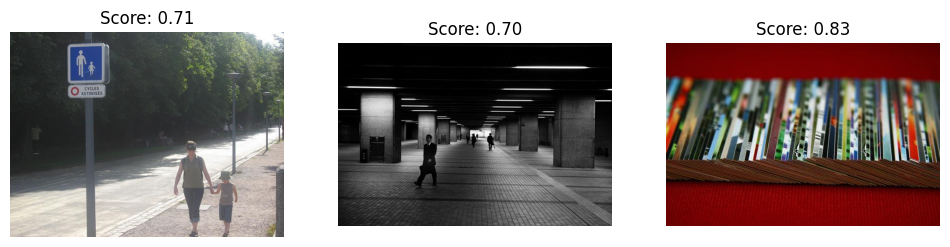

In [3]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt


df = pd.read_csv(f'{DATA_PATH}/data/image_list_final_with_scores.csv')
print(df.head())
print(f"Dataset size: {len(df)}")

# Sanity check: show a few images with their scores
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for i, ax in enumerate(axes):
    img = Image.open(f"{DATA_PATH}/data/{df.iloc[i]['image_path']}")
    ax.imshow(img)
    ax.set_title(f"Score: {df.iloc[i]['memorability_score']:.2f}")
    ax.axis('off')
plt.show()

In [4]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

class LaMemDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img = Image.open(f"{self.img_dir}/{self.df.iloc[idx]['image_path']}").convert('RGB')
        score = torch.tensor(self.df.iloc[idx]['memorability_score'], dtype=torch.float32)
        if self.transform:
            img = self.transform(img)
        return img, score

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

img_dir = f"{DATA_PATH}/data/"


train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)
train_loader = DataLoader(LaMemDataset(train_df, img_dir, transform), batch_size=32, shuffle=True)
val_loader = DataLoader(LaMemDataset(val_df, img_dir, transform), batch_size=32)

print(f"Train: {len(train_df)}, Val: {len(val_df)}")

Train: 800, Val: 200


In [5]:
import torch.nn as nn
import timm

class MemorabilityModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('resnet50', pretrained=True, num_classes=0)
        self.regressor = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        features = self.backbone(x)
        return self.regressor(features).squeeze()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MemorabilityModel().to(device)
print(f"Running on: {device}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:103: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Running on: cuda


In [7]:
import torch.optim as optim

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

def train_epoch(model, loader):
    model.train()
    total_loss = 0
    for imgs, scores in loader:
        imgs, scores = imgs.to(device), scores.to(device)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, scores)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def val_epoch(model, loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for imgs, scores in loader:
            imgs, scores = imgs.to(device), scores.to(device)
            preds = model(imgs)
            total_loss += criterion(preds, scores).item()
    return total_loss / len(loader)

# Running 20 epochs
from tqdm.notebook import tqdm

for epoch in range(20):
    model.train()
    total_loss = 0
    for imgs, scores in tqdm(train_loader, desc=f"Epoch {epoch+1}/20"):
        imgs, scores = imgs.to(device), scores.to(device)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, scores)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    val_loss = val_epoch(model, val_loader)
    print(f"Epoch {epoch+1} | Train Loss: {total_loss/len(train_loader):.4f} | Val Loss: {val_loss:.4f}")

Epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1 | Train Loss: 0.0129 | Val Loss: 0.0141


Epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2 | Train Loss: 0.0086 | Val Loss: 0.0130


Epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3 | Train Loss: 0.0064 | Val Loss: 0.0127


Epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4 | Train Loss: 0.0051 | Val Loss: 0.0126


Epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5 | Train Loss: 0.0037 | Val Loss: 0.0129


Epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6 | Train Loss: 0.0030 | Val Loss: 0.0134


Epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7 | Train Loss: 0.0023 | Val Loss: 0.0134


Epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8 | Train Loss: 0.0021 | Val Loss: 0.0130


Epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9 | Train Loss: 0.0019 | Val Loss: 0.0133


Epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10 | Train Loss: 0.0019 | Val Loss: 0.0142


Epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11 | Train Loss: 0.0019 | Val Loss: 0.0141


Epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12 | Train Loss: 0.0015 | Val Loss: 0.0136


Epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13 | Train Loss: 0.0014 | Val Loss: 0.0139


Epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14 | Train Loss: 0.0014 | Val Loss: 0.0137


Epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15 | Train Loss: 0.0014 | Val Loss: 0.0137


Epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16 | Train Loss: 0.0012 | Val Loss: 0.0133


Epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17 | Train Loss: 0.0011 | Val Loss: 0.0133


Epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18 | Train Loss: 0.0011 | Val Loss: 0.0134


Epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19 | Train Loss: 0.0010 | Val Loss: 0.0132


Epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20 | Train Loss: 0.0009 | Val Loss: 0.0130


In [8]:
from datetime import datetime
timestamp = datetime.now().strftime("%m%d%y_%H%M%S")
torch.save(model.state_dict(), f'{DATA_PATH}/checkpoints/{timestamp}_model_epoch3.pth')
print(f"Saved: {timestamp}_model_epoch3.pth")

Saved: 050826_213150_model_epoch3.pth


In [10]:
# ── DEPENDENCIES ────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import timm
from PIL import Image
from torchvision import transforms
from scipy import stats

# ── PATHS ────────────────────────────────────────────────────────────
# Update DATA_PATH to match your Drive location
DATA_PATH    = "/content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission"
CHECKPOINT   = f"{DATA_PATH}/checkpoints/050626_215834_model_epoch3.pth"   # <-- update
ORIG_DIR     = f"{DATA_PATH}/data/lamem_final"         # <-- update if needed
BLURRED_DIR  = f"{DATA_PATH}/data/ablation_face_blur"          # <-- update if needed
RESULTS_DIR  = f"{DATA_PATH}/results/blur"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [11]:
# ── MODEL ────────────────────────────────────────────────────────────
class MemorabilityModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('resnet50', pretrained=False, num_classes=0)
        self.regressor = nn.Sequential(
            nn.Linear(2048, 512), nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1), nn.Sigmoid()
        )
    def forward(self, x):
        return self.regressor(self.backbone(x)).squeeze()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = MemorabilityModel().to(device)
model.load_state_dict(torch.load(CHECKPOINT, map_location=device))
model.eval()
print(f"Model loaded on: {device}")

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def predict_score(pil_img):
    with torch.no_grad():
        t = transform(pil_img).unsqueeze(0).to(device)
        return model(t).item()

Model loaded on: cuda


In [12]:
# ── SCORE ALL PAIRS ──────────────────────────────────────────────────
filenames = sorted([
    f for f in os.listdir(ORIG_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])

results = []
for fname in filenames:
    blurred_path = os.path.join(BLURRED_DIR, fname)
    if not os.path.exists(blurred_path):
        continue
    orig    = Image.open(os.path.join(ORIG_DIR, fname)).convert('RGB')
    blurred = Image.open(blurred_path).convert('RGB')
    s_orig  = predict_score(orig)
    s_blur  = predict_score(blurred)
    results.append({'filename': fname, 'original': s_orig,
                    'blurred': s_blur, 'delta': s_blur - s_orig})

df = pd.DataFrame(results)
print(f"Pairs evaluated: {len(df)}")
print(df[['original','blurred','delta']].describe().round(4))
df.to_csv(f"{RESULTS_DIR}/blur_scores.csv", index=False)
print("Saved: blur_scores.csv")

Pairs evaluated: 999
       original   blurred     delta
count  999.0000  999.0000  999.0000
mean     0.7360    0.7354   -0.0007
std      0.0855    0.0848    0.0183
min      0.5166    0.5161   -0.1241
25%      0.6716    0.6714   -0.0064
50%      0.7381    0.7389    0.0004
75%      0.7986    0.7979    0.0075
max      0.9460    0.9461    0.0940
Saved: blur_scores.csv


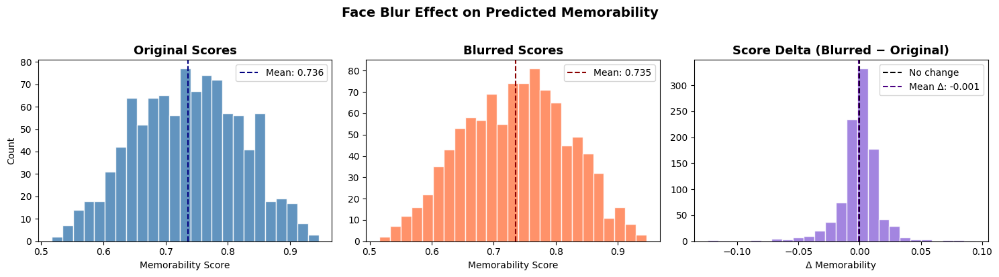

In [13]:
# ── FIGURE 1: Score distributions ───────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(df['original'], bins=25, color='steelblue', edgecolor='white', alpha=0.85)
axes[0].set_title('Original Scores', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Memorability Score'); axes[0].set_ylabel('Count')
axes[0].axvline(df['original'].mean(), color='navy', linestyle='--', label=f"Mean: {df['original'].mean():.3f}")
axes[0].legend()

axes[1].hist(df['blurred'], bins=25, color='coral', edgecolor='white', alpha=0.85)
axes[1].set_title('Blurred Scores', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Memorability Score')
axes[1].axvline(df['blurred'].mean(), color='darkred', linestyle='--', label=f"Mean: {df['blurred'].mean():.3f}")
axes[1].legend()

axes[2].hist(df['delta'], bins=25, color='mediumpurple', edgecolor='white', alpha=0.85)
axes[2].axvline(0, color='black', linestyle='--', linewidth=1.5, label='No change')
axes[2].axvline(df['delta'].mean(), color='indigo', linestyle='--', label=f"Mean Δ: {df['delta'].mean():+.3f}")
axes[2].set_title('Score Delta (Blurred − Original)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Δ Memorability')
axes[2].legend()

plt.suptitle('Face Blur Effect on Predicted Memorability', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig1_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

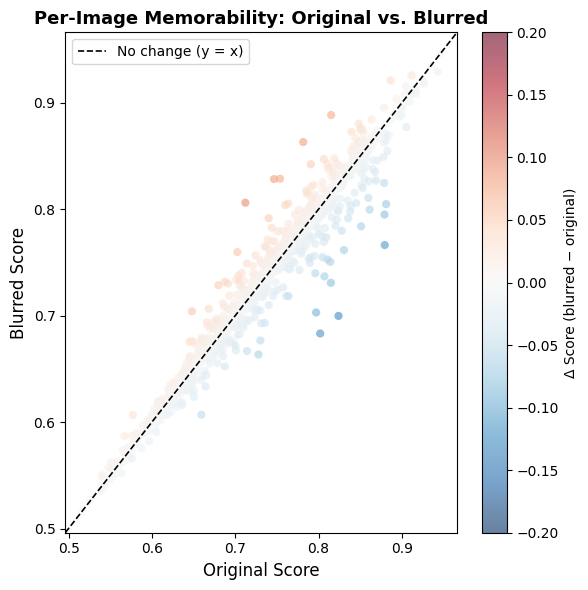

In [14]:
# ── FIGURE 2: Per-image scatter (original vs. blurred) ───────────────
fig, ax = plt.subplots(figsize=(6, 6))
sc = ax.scatter(df['original'], df['blurred'],
                c=df['delta'], cmap='RdBu_r', vmin=-0.2, vmax=0.2,
                alpha=0.6, s=35, edgecolors='none')
lims = [min(df[['original','blurred']].min()) - 0.02,
        max(df[['original','blurred']].max()) + 0.02]
ax.plot(lims, lims, 'k--', linewidth=1.2, label='No change (y = x)')
ax.set_xlim(lims); ax.set_ylim(lims)
ax.set_xlabel('Original Score', fontsize=12)
ax.set_ylabel('Blurred Score', fontsize=12)
ax.set_title('Per-Image Memorability: Original vs. Blurred', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
plt.colorbar(sc, ax=ax, label='Δ Score (blurred − original)')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig2_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

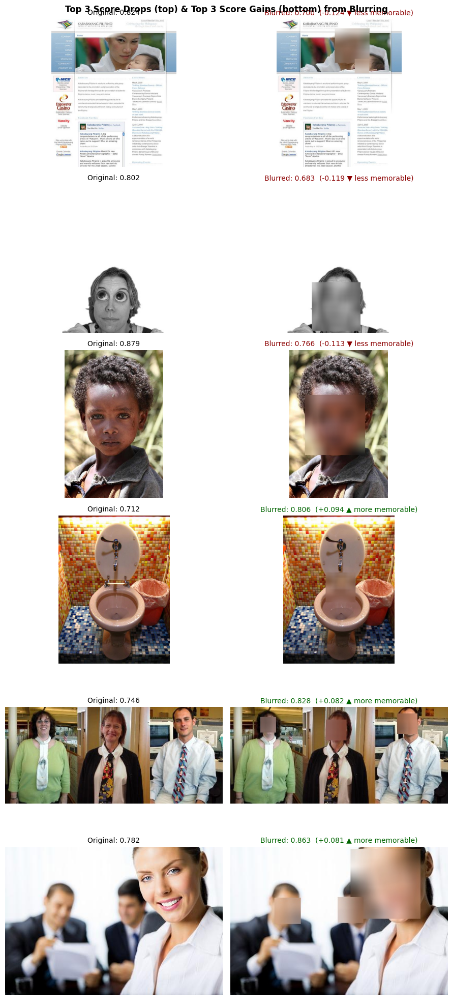

In [15]:
# ── FIGURE 3: Top 6 most-affected pairs (3 biggest drops, 3 biggest gains) ─
top_drops = df.nsmallest(3, 'delta')   # blurring hurt memorability most
top_gains = df.nlargest(3, 'delta')    # blurring helped memorability most
showcase  = pd.concat([top_drops, top_gains])

fig, axes = plt.subplots(6, 2, figsize=(9, 20))
for i, (_, row) in enumerate(showcase.iterrows()):
    orig    = Image.open(os.path.join(ORIG_DIR, row['filename'])).convert('RGB')
    blurred = Image.open(os.path.join(BLURRED_DIR, row['filename'])).convert('RGB')
    color   = 'darkgreen' if row['delta'] > 0 else 'darkred'
    label   = '▲ more memorable' if row['delta'] > 0 else '▼ less memorable'

    axes[i,0].imshow(orig)
    axes[i,0].set_title(f"Original: {row['original']:.3f}", fontsize=10)
    axes[i,0].axis('off')

    axes[i,1].imshow(blurred)
    axes[i,1].set_title(
        f"Blurred: {row['blurred']:.3f}  ({row['delta']:+.3f} {label})",
        fontsize=10, color=color
    )
    axes[i,1].axis('off')

fig.suptitle('Top 3 Score Drops (top) & Top 3 Score Gains (bottom) from Blurring',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig3_top_pairs.png', dpi=150, bbox_inches='tight')
plt.show()

In [16]:
# ── STATISTICAL SUMMARY ──────────────────────────────────────────────
t_stat, p_val = stats.ttest_rel(df['original'], df['blurred'])
pct_down = (df['delta'] < 0).mean() * 100
pct_up   = (df['delta'] > 0).mean() * 100

print("=" * 45)
print("FACE BLUR ABLATION — SUMMARY")
print("=" * 45)
print(f"N pairs               : {len(df)}")
print(f"Mean original score   : {df['original'].mean():.4f}  (std {df['original'].std():.4f})")
print(f"Mean blurred score    : {df['blurred'].mean():.4f}  (std {df['blurred'].std():.4f})")
print(f"Mean delta            : {df['delta'].mean():+.4f}  (std {df['delta'].std():.4f})")
print(f"% pairs score dropped : {pct_down:.1f}%")
print(f"% pairs score rose    : {pct_up:.1f}%")
print(f"Paired t-test         : t = {t_stat:.3f},  p = {p_val:.4f}")
sig = "SIGNIFICANT" if p_val < 0.05 else "NOT significant"
print(f"Result                : {sig} at α = 0.05")

FACE BLUR ABLATION — SUMMARY
N pairs               : 999
Mean original score   : 0.7360  (std 0.0855)
Mean blurred score    : 0.7354  (std 0.0848)
Mean delta            : -0.0007  (std 0.0183)
% pairs score dropped : 48.5%
% pairs score rose    : 51.5%
Paired t-test         : t = 1.129,  p = 0.2593
Result                : NOT significant at α = 0.05


In [17]:
# ── DEPENDENCIES ────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from PIL import Image
from torchvision import transforms

# ── PATHS ────────────────────────────────────────────────────────────
DATA_PATH    = "/content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission"
CHECKPOINT   = f"{DATA_PATH}/checkpoints/050626_215834_model_epoch3.pth"   # <-- update
ORIG_DIR     = f"{DATA_PATH}/data/lamem_final"         # <-- update if needed
BLURRED_DIR  = f"{DATA_PATH}/data/ablation_face_blur"          # <-- update if needed
SCORES_CSV  = f"{DATA_PATH}/results/blur/blur_scores.csv"       # output from blur notebook
RESULTS_DIR = f"{DATA_PATH}/results/heatmaps"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [18]:
# ── MODEL ────────────────────────────────────────────────────────────
class MemorabilityModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('resnet50', pretrained=False, num_classes=0)
        self.regressor = nn.Sequential(
            nn.Linear(2048, 512), nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1), nn.Sigmoid()
        )
    def forward(self, x):
        return self.regressor(self.backbone(x)).squeeze()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = MemorabilityModel().to(device)
model.load_state_dict(torch.load(CHECKPOINT, map_location=device))
model.eval()
print(f"Model loaded on: {device}")

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

Model loaded on: cuda


In [19]:
# ── GRAD-CAM ─────────────────────────────────────────────────────────
# Hooks into model.backbone.layer4[-1] — the last and most semantic ResNet block.
# Gradients flowing back from the memorability score tell us which spatial
# regions most influenced the prediction.

class GradCAM:
    def __init__(self, model):
        self.model       = model
        self._activations = None
        self._gradients   = None
        target = model.backbone.layer4[-1]
        target.register_forward_hook(self._save_act)
        target.register_full_backward_hook(self._save_grad)

    def _save_act(self, module, inp, out):
        self._activations = out.detach()

    def _save_grad(self, module, grad_in, grad_out):
        self._gradients = grad_out[0].detach()

    def generate(self, pil_img):
        """Returns (memorability_score float, cam array 224x224 normalized 0-1)."""
        self.model.eval()
        tensor = transform(pil_img).unsqueeze(0).to(device).requires_grad_(True)
        score  = self.model(tensor)
        self.model.zero_grad()
        score.backward()
        # Global average pool gradients → spatial weights
        weights = self._gradients.mean(dim=[2, 3], keepdim=True)
        # Weighted combination of feature maps + ReLU
        cam = F.relu((weights * self._activations).sum(dim=1, keepdim=True))
        # Upsample to input resolution
        cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return score.item(), cam

gradcam = GradCAM(model)

def make_overlay(pil_img, cam, alpha=0.45):
    """Blend a jet-colored CAM over the resized original image."""
    cmap    = matplotlib.colormaps['jet']
    cam_rgb = (cmap(cam)[:, :, :3] * 255).astype(np.uint8)
    base    = np.array(pil_img.resize((224, 224))).astype(np.float32)
    return ((1 - alpha) * base + alpha * cam_rgb).clip(0, 255).astype(np.uint8)

print("GradCAM ready.")

GradCAM ready.


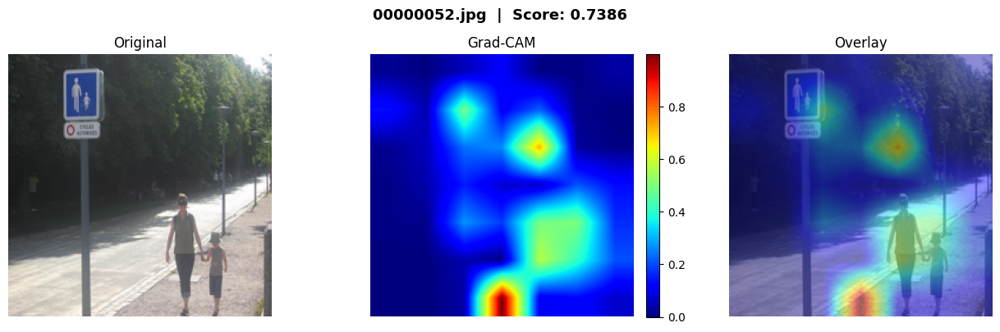

In [20]:
# ── FIGURE 1: Single-image heatmap (original image) ──────────────────
# Pick any image to demo the full pipeline

filenames = sorted([
    f for f in os.listdir(ORIG_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])

DEMO_FILE = filenames[0]   # change index or hardcode a filename
demo_img  = Image.open(os.path.join(ORIG_DIR, DEMO_FILE)).convert('RGB')
score, cam = gradcam.generate(demo_img)
overlay    = make_overlay(demo_img, cam)

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].imshow(demo_img.resize((224, 224))); axes[0].set_title('Original'); axes[0].axis('off')
im = axes[1].imshow(cam, cmap='jet'); axes[1].set_title('Grad-CAM'); axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
axes[2].imshow(overlay); axes[2].set_title('Overlay'); axes[2].axis('off')
fig.suptitle(f'{DEMO_FILE}  |  Score: {score:.4f}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig1_single_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

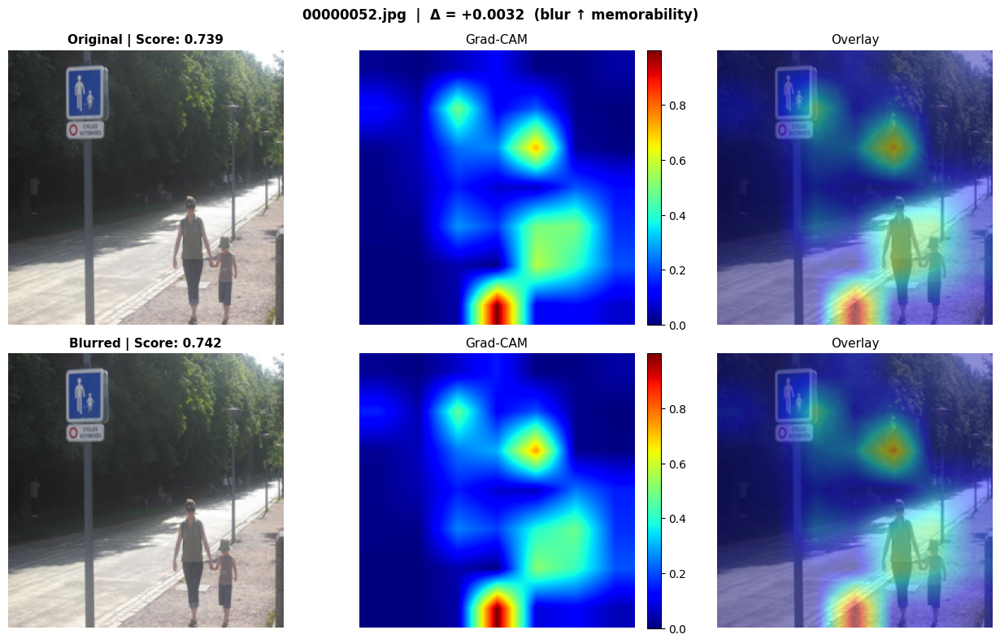

In [21]:
# ── FIGURE 2: Original vs. Blurred heatmap comparison ────────────────
# For a single pair: shows whether the model's attention shifts
# when faces are removed.

def compare_heatmaps(filename, save=True):
    orig_img    = Image.open(os.path.join(ORIG_DIR, filename)).convert('RGB')
    blurred_img = Image.open(os.path.join(BLURRED_DIR, filename)).convert('RGB')

    s_orig, cam_orig = gradcam.generate(orig_img)
    s_blur, cam_blur = gradcam.generate(blurred_img)
    ov_orig = make_overlay(orig_img, cam_orig)
    ov_blur = make_overlay(blurred_img, cam_blur)

    fig, axes = plt.subplots(2, 3, figsize=(13, 8))
    for row_idx, (img, cam, overlay, label, sc) in enumerate([
        (orig_img,    cam_orig, ov_orig, 'Original', s_orig),
        (blurred_img, cam_blur, ov_blur, 'Blurred',  s_blur)
    ]):
        axes[row_idx, 0].imshow(img.resize((224, 224)))
        axes[row_idx, 0].set_title(f'{label} | Score: {sc:.3f}', fontsize=11, fontweight='bold')
        axes[row_idx, 0].axis('off')

        im = axes[row_idx, 1].imshow(cam, cmap='jet')
        axes[row_idx, 1].set_title('Grad-CAM', fontsize=11)
        axes[row_idx, 1].axis('off')
        plt.colorbar(im, ax=axes[row_idx, 1], fraction=0.046, pad=0.04)

        axes[row_idx, 2].imshow(overlay)
        axes[row_idx, 2].set_title('Overlay', fontsize=11)
        axes[row_idx, 2].axis('off')

    delta = s_blur - s_orig
    fig.suptitle(f'{filename}  |  Δ = {delta:+.4f}  ({"blur ↑ memorability" if delta > 0 else "blur ↓ memorability"})',
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    if save:
        stem = filename.rsplit('.', 1)[0]
        plt.savefig(f'{RESULTS_DIR}/fig2_compare_{stem}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Run on the demo image first
compare_heatmaps(DEMO_FILE)

Loaded 999 pre-computed scores from blur notebook.


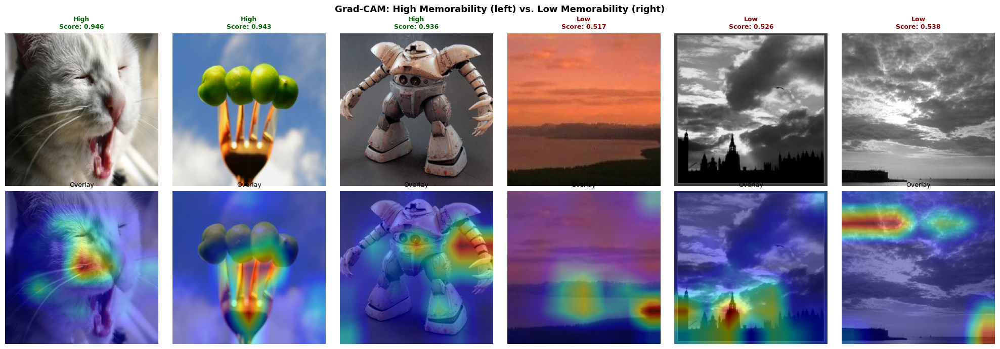

In [22]:
# ── FIGURE 3: Grid of 6 heatmap overlays (varied memorability scores) ─
# Gives a broad visual survey of what the model attends to across the dataset.
# Picks 3 high-scoring and 3 low-scoring images for contrast.

# Score all originals first (or load from blur notebook CSV if available)
if os.path.exists(SCORES_CSV):
    df_scores = pd.read_csv(SCORES_CSV)
    print(f"Loaded {len(df_scores)} pre-computed scores from blur notebook.")
else:
    print("Scoring all originals — this may take a minute...")
    rows = []
    for f in filenames:
        img = Image.open(os.path.join(ORIG_DIR, f)).convert('RGB')
        with torch.no_grad():
            s = model(transform(img).unsqueeze(0).to(device)).item()
        rows.append({'filename': f, 'original': s})
    df_scores = pd.DataFrame(rows)

high3 = df_scores.nlargest(3, 'original')['filename'].tolist()
low3  = df_scores.nsmallest(3, 'original')['filename'].tolist()
survey = high3 + low3
labels = ['High'] * 3 + ['Low'] * 3

fig, axes = plt.subplots(2, 6, figsize=(20, 7))
for col, (fname, cat) in enumerate(zip(survey, labels)):
    img = Image.open(os.path.join(ORIG_DIR, fname)).convert('RGB')
    sc, cam = gradcam.generate(img)
    overlay = make_overlay(img, cam)

    axes[0, col].imshow(img.resize((224, 224)))
    axes[0, col].set_title(f'{cat}\nScore: {sc:.3f}', fontsize=9,
                            color='darkgreen' if cat == 'High' else 'darkred', fontweight='bold')
    axes[0, col].axis('off')

    axes[1, col].imshow(overlay)
    axes[1, col].set_title('Overlay', fontsize=9)
    axes[1, col].axis('off')

fig.suptitle('Grad-CAM: High Memorability (left) vs. Low Memorability (right)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig3_high_vs_low_heatmaps.png', dpi=150, bbox_inches='tight')
plt.show()

Running heatmap comparisons for 6 pairs...


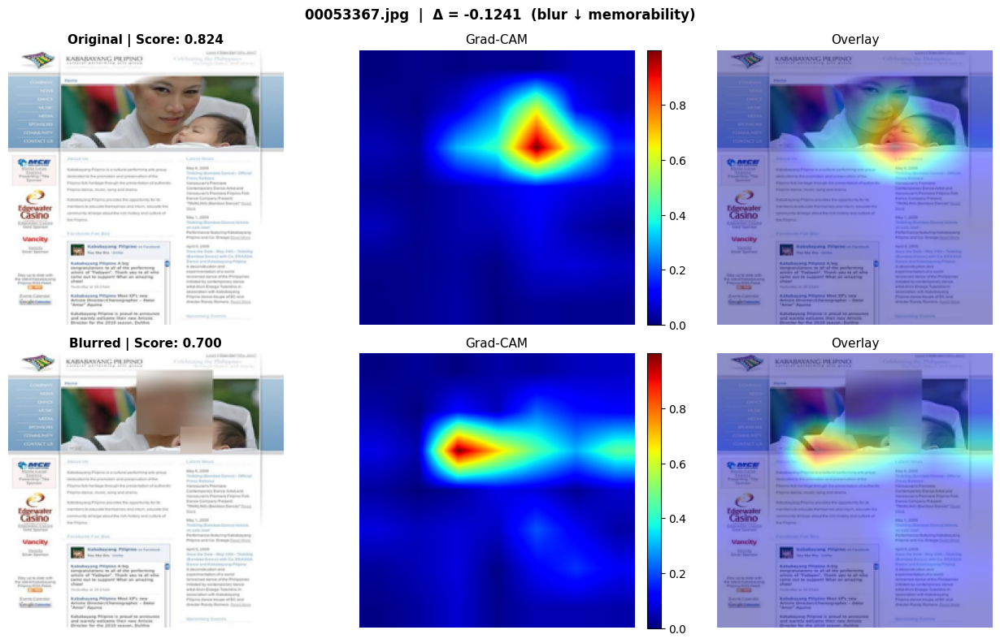

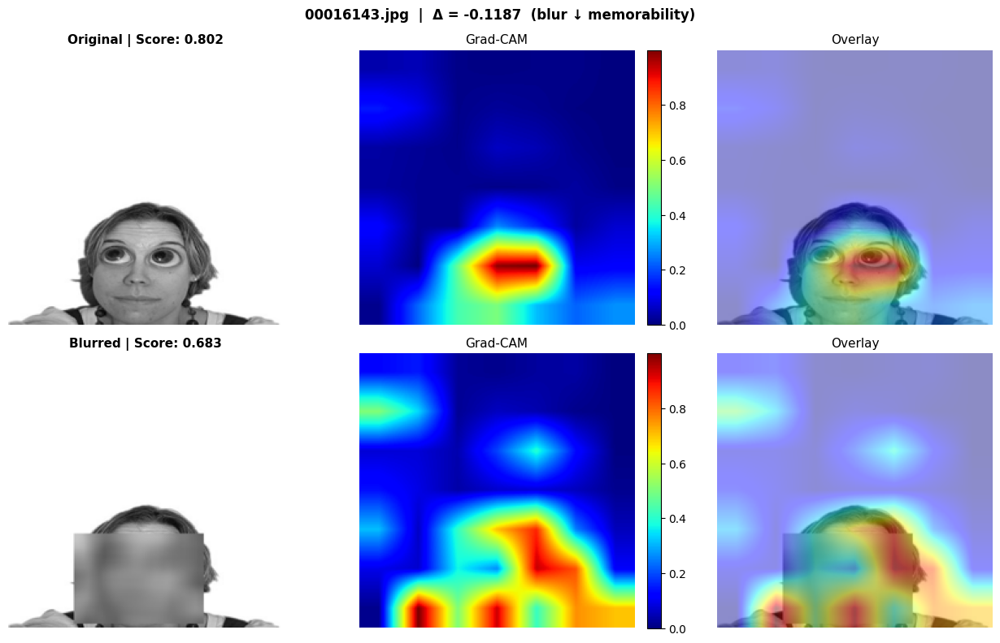

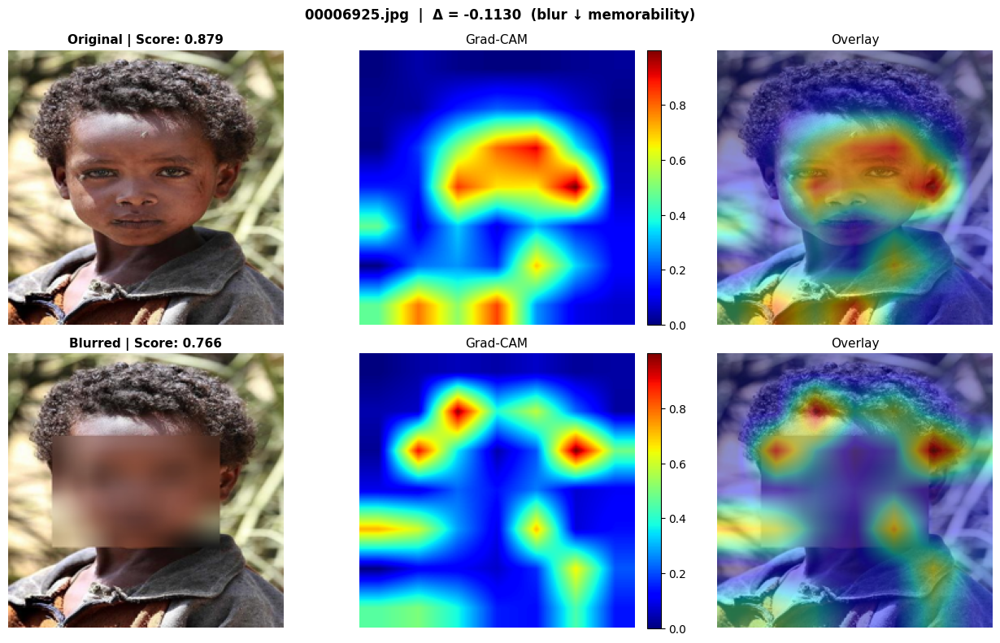

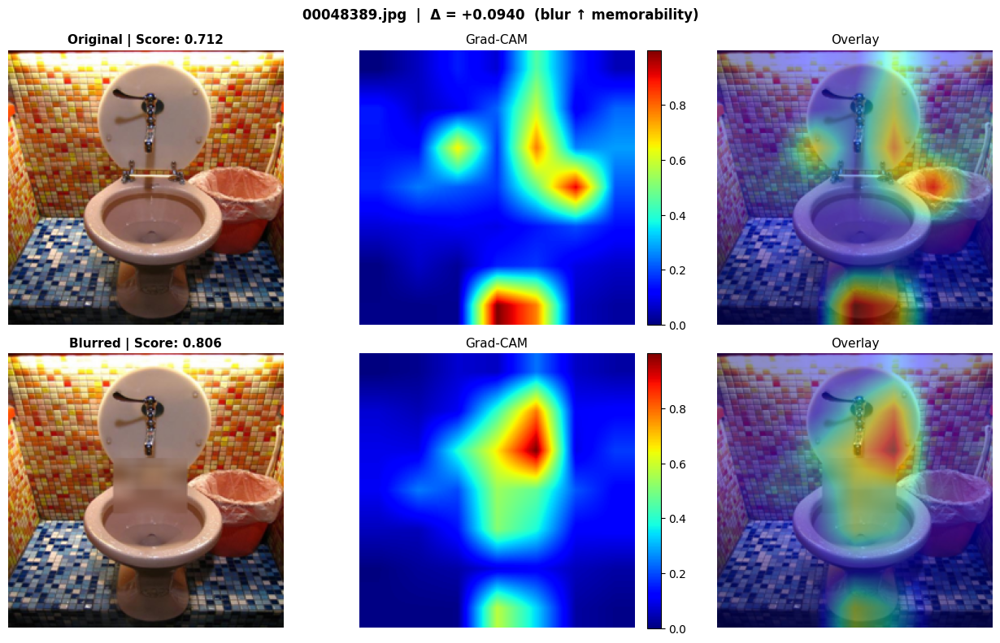

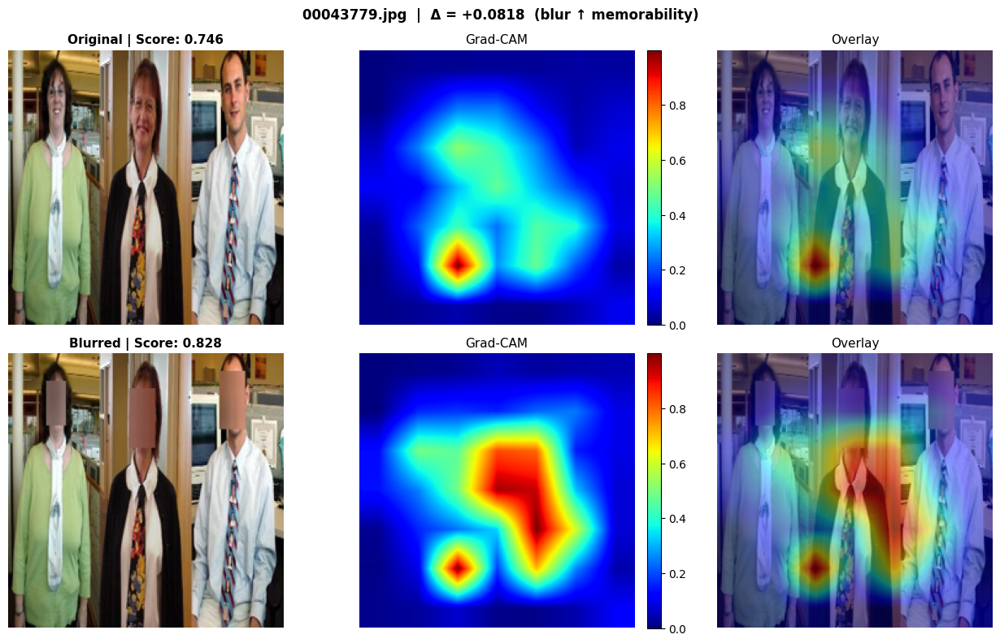

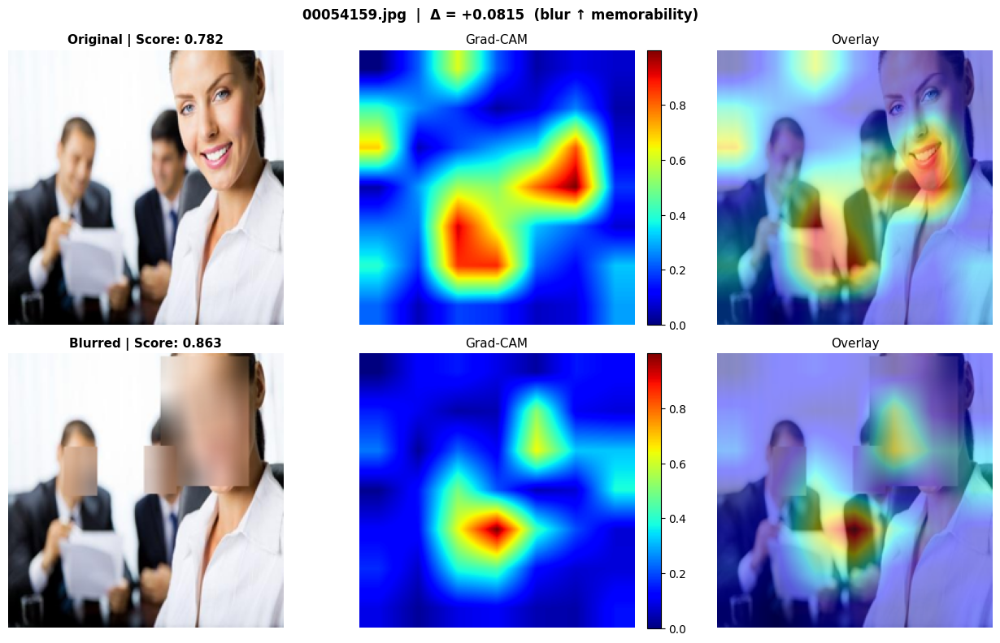

In [23]:
# ── FIGURE 4: Batch heatmap comparisons for top-affected pairs ────────
# Uses the blur_scores.csv from the face blur notebook to pick the
# pairs where score changed most — then shows heatmaps for all of them.

if os.path.exists(SCORES_CSV):
    df_blur = pd.read_csv(SCORES_CSV)
    # Top 3 biggest drops + top 3 biggest gains
    showcase = pd.concat([
        df_blur.nsmallest(3, 'delta'),
        df_blur.nlargest(3, 'delta')
    ])
    print(f"Running heatmap comparisons for {len(showcase)} pairs...")
    for _, row in showcase.iterrows():
        compare_heatmaps(row['filename'], save=True)
else:
    print("blur_scores.csv not found — run the face blur notebook first, or pick files manually below.")
    # Manual fallback: pick files directly
    manual_files = filenames[:3]   # <-- replace with specific filenames if desired
    for f in manual_files:
        compare_heatmaps(f, save=True)

In [24]:
# ── DEPENDENCIES ─────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import torch.nn as nn
import timm
from PIL import Image
from torchvision import transforms
from scipy import stats

# ── PATHS ─────────────────────────────────────────────────────────────
DATA_PATH   = "/content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission"
CHECKPOINT  = f"{DATA_PATH}/checkpoints/050626_215834_model_epoch3.pth"

# Original images shared across all ablations
ORIG_DIR    = f"{DATA_PATH}/data/lamem_final"

# One folder per ablation type — update these to match your actual folder names
ABLATION_DIRS = {
    "grayscale":   f"{DATA_PATH}/data/ablation_grayscale",
    "whole_blur":  f"{DATA_PATH}/data/ablation_blur",       # whole image blurred
    "text_blur":   f"{DATA_PATH}/data/ablation_text_blur",     # text regions blurred
    "crop":        f"{DATA_PATH}/data/ablation_center_crop",     # center crop
}

RESULTS_DIR = f"{DATA_PATH}/results/ablations"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [25]:
# ── VALIDATE PATHS ───────────────────────────────────────────────────
all_ok = True
for label, path in {"Checkpoint": CHECKPOINT, "Original dir": ORIG_DIR, **ABLATION_DIRS}.items():
    exists = os.path.exists(path)
    print(f"{'✅' if exists else '❌  NOT FOUND'}  {label}: {path}")
    if not exists:
        all_ok = False
    elif os.path.isdir(path):
        imgs = [f for f in os.listdir(path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
        print(f"   └─ {len(imgs)} images")

if not all_ok:
    raise FileNotFoundError("Fix missing paths above before continuing.")
print("\nAll paths valid ✅")

✅  Checkpoint: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission/checkpoints/050626_215834_model_epoch3.pth
✅  Original dir: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission/data/lamem_final
   └─ 1000 images
✅  grayscale: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission/data/ablation_grayscale
   └─ 1000 images
✅  whole_blur: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission/data/ablation_blur
   └─ 1000 images
✅  text_blur: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Project/Public/final_submission/data/ablation_text_blur
   └─ 999 images
✅  crop: /content/drive/MyDrive/STATUN3106 - Applied Machine Learning/Final Project/STATUN3106_Final_Projec

In [26]:
# ── MODEL ─────────────────────────────────────────────────────────────
class MemorabilityModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('resnet50', pretrained=False, num_classes=0)
        self.regressor = nn.Sequential(
            nn.Linear(2048, 512), nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1), nn.Sigmoid()
        )
    def forward(self, x):
        return self.regressor(self.backbone(x)).squeeze()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = MemorabilityModel().to(device)
model.load_state_dict(torch.load(CHECKPOINT, map_location=device))
model.eval()
print(f"Model loaded on: {device}")

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def predict_score(pil_img):
    with torch.no_grad():
        t = transform(pil_img).unsqueeze(0).to(device)
        return model(t).item()

Model loaded on: cuda


In [27]:
# ── SCORE ALL ABLATION TYPES (batched) ──────────────────────────────
from torch.utils.data import DataLoader, Dataset

class ImageFolder(Dataset):
    def __init__(self, paths):
        self.paths = paths
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, i):
        img = Image.open(self.paths[i]).convert('RGB')
        return transform(img), os.path.basename(self.paths[i])

def score_batch(img_dir, filenames, batch_size=128):
    valid_paths = [os.path.join(img_dir, f) for f in filenames
                   if os.path.exists(os.path.join(img_dir, f))]
    dataset = ImageFolder(valid_paths)
    loader  = DataLoader(dataset, batch_size=batch_size, num_workers=2, pin_memory=True)
    scores  = {}
    model.eval()
    with torch.no_grad():
        for imgs, fnames in loader:
            imgs  = imgs.to(device)
            preds = model(imgs).cpu().numpy()
            for fname, score in zip(fnames, preds):
                scores[fname] = float(score)
    return scores

orig_filenames = sorted([
    f for f in os.listdir(ORIG_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])

# Score originals once as shared baseline
print("Scoring originals...")
orig_scores = score_batch(ORIG_DIR, orig_filenames)
print(f"  {len(orig_scores)} done.")

# Score each ablation type
all_results = {}
for name, abl_dir in ABLATION_DIRS.items():
    print(f"Scoring {name}...")
    abl_scores = score_batch(abl_dir, orig_filenames)
    rows = [
        {'filename': f, 'original': orig_scores[f],
         'ablated': abl_scores[f], 'delta': abl_scores[f] - orig_scores[f]}
        for f in orig_filenames if f in abl_scores
    ]
    df = pd.DataFrame(rows)
    all_results[name] = df
    df.to_csv(f"{RESULTS_DIR}/{name}_scores.csv", index=False)
    print(f"  {len(df)} pairs scored. Saved to {name}_scores.csv")

print("\nAll ablations complete ✅")

Scoring originals...
  1000 done.
Scoring grayscale...
  1000 pairs scored. Saved to grayscale_scores.csv
Scoring whole_blur...
  1000 pairs scored. Saved to whole_blur_scores.csv
Scoring text_blur...
  999 pairs scored. Saved to text_blur_scores.csv
Scoring crop...
  1000 pairs scored. Saved to crop_scores.csv

All ablations complete ✅


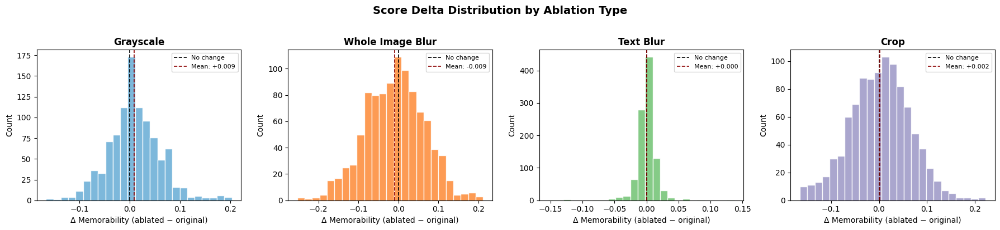

In [28]:
# ── FIGURE 1: Delta distributions — one subplot per ablation type ────
COLORS = {
    'grayscale':  '#6baed6',
    'whole_blur': '#fd8d3c',
    'text_blur':  '#74c476',
    'crop':       '#9e9ac8',
}
LABELS = {
    'grayscale':  'Grayscale',
    'whole_blur': 'Whole Image Blur',
    'text_blur':  'Text Blur',
    'crop':       'Crop',
}

fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharey=False)

for ax, (name, df) in zip(axes, all_results.items()):
    ax.hist(df['delta'], bins=25, color=COLORS[name], edgecolor='white', alpha=0.88)
    ax.axvline(0, color='black', linestyle='--', linewidth=1.2, label='No change')
    ax.axvline(df['delta'].mean(), color='darkred', linestyle='--', linewidth=1.2,
               label=f"Mean: {df['delta'].mean():+.3f}")
    ax.set_title(LABELS[name], fontsize=12, fontweight='bold')
    ax.set_xlabel('Δ Memorability (ablated − original)')
    ax.set_ylabel('Count')
    ax.legend(fontsize=8)

fig.suptitle('Score Delta Distribution by Ablation Type', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig1_delta_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

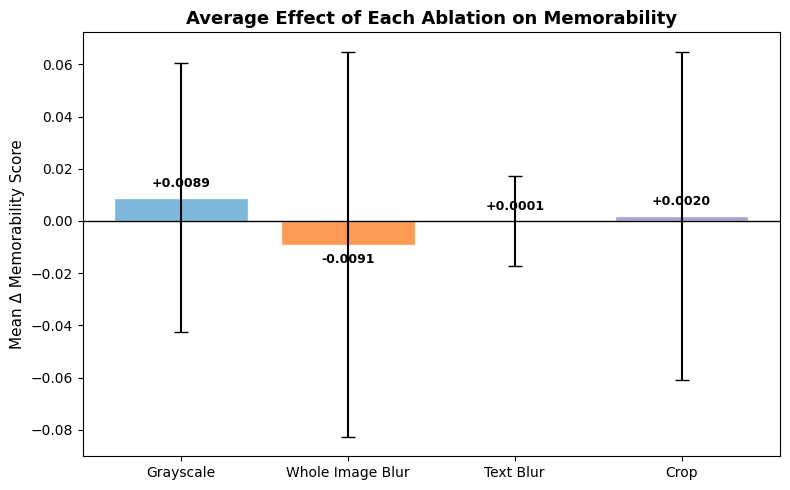

In [29]:
# ── FIGURE 2: Mean delta comparison bar chart ────────────────────────
means  = {LABELS[k]: v['delta'].mean() for k, v in all_results.items()}
stds   = {LABELS[k]: v['delta'].std()  for k, v in all_results.items()}
colors = [COLORS[k] for k in all_results]

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(means.keys(), means.values(), yerr=stds.values(),
              color=colors, edgecolor='white', capsize=5, alpha=0.88)
ax.axhline(0, color='black', linewidth=1)
ax.set_ylabel('Mean Δ Memorability Score', fontsize=11)
ax.set_title('Average Effect of Each Ablation on Memorability', fontsize=13, fontweight='bold')
for bar, val in zip(bars, means.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + (0.003 if val >= 0 else -0.008),
            f'{val:+.4f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig2_mean_deltas.png', dpi=150, bbox_inches='tight')
plt.show()

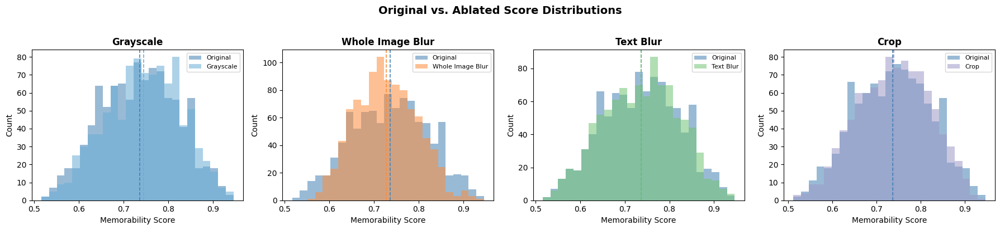

In [30]:
# ── FIGURE 3: Overlaid score distributions (original vs ablated) ─────
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

for ax, (name, df) in zip(axes, all_results.items()):
    bins = np.linspace(
        min(df['original'].min(), df['ablated'].min()),
        max(df['original'].max(), df['ablated'].max()),
        26
    )
    ax.hist(df['original'], bins=bins, color='steelblue', alpha=0.55, label='Original')
    ax.hist(df['ablated'],  bins=bins, color=COLORS[name], alpha=0.55, label=LABELS[name])
    ax.axvline(df['original'].mean(), color='steelblue', linestyle='--', linewidth=1.2)
    ax.axvline(df['ablated'].mean(),  color=COLORS[name], linestyle='--', linewidth=1.2)
    ax.set_title(LABELS[name], fontsize=12, fontweight='bold')
    ax.set_xlabel('Memorability Score')
    ax.set_ylabel('Count')
    ax.legend(fontsize=8)

fig.suptitle('Original vs. Ablated Score Distributions', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig3_overlaid_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

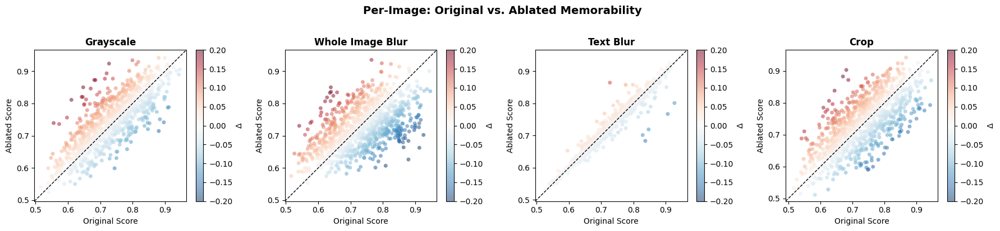

In [31]:
# ── FIGURE 4: Per-image scatter (original vs ablated) ────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

for ax, (name, df) in zip(axes, all_results.items()):
    sc = ax.scatter(df['original'], df['ablated'],
                    c=df['delta'], cmap='RdBu_r', vmin=-0.2, vmax=0.2,
                    alpha=0.5, s=25, edgecolors='none')
    lims = [
        min(df[['original','ablated']].min()) - 0.02,
        max(df[['original','ablated']].max()) + 0.02
    ]
    ax.plot(lims, lims, 'k--', linewidth=1, label='No change')
    ax.set_xlim(lims); ax.set_ylim(lims)
    ax.set_xlabel('Original Score')
    ax.set_ylabel('Ablated Score')
    ax.set_title(LABELS[name], fontsize=12, fontweight='bold')
    plt.colorbar(sc, ax=ax, label='Δ')

fig.suptitle('Per-Image: Original vs. Ablated Memorability', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig4_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

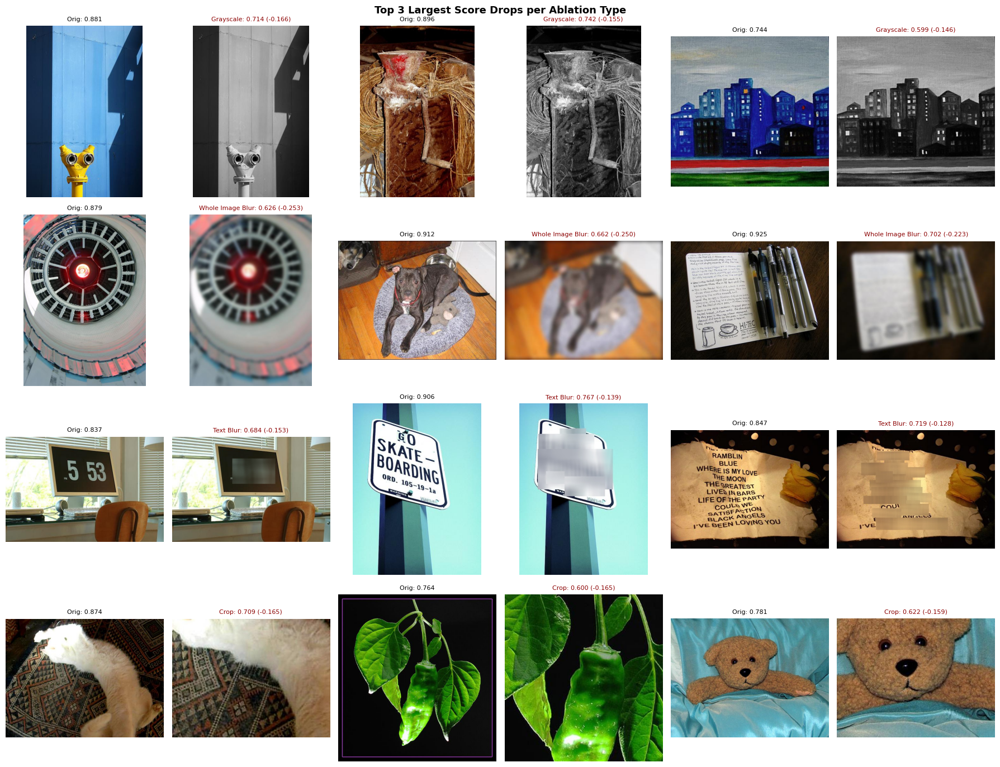

In [32]:
# ── FIGURE 5: Visual examples — top 3 biggest drops per ablation ─────
fig, axes = plt.subplots(4, 6, figsize=(18, 14))

for row_idx, (name, df) in enumerate(all_results.items()):
    top3 = df.nsmallest(3, 'delta')
    for col_idx, (_, r) in enumerate(top3.iterrows()):
        # Original
        orig = Image.open(os.path.join(ORIG_DIR, r['filename'])).convert('RGB')
        axes[row_idx, col_idx * 2].imshow(orig)
        axes[row_idx, col_idx * 2].set_title(f"Orig: {r['original']:.3f}", fontsize=8)
        axes[row_idx, col_idx * 2].axis('off')
        # Ablated
        abl = Image.open(os.path.join(ABLATION_DIRS[name], r['filename'])).convert('RGB')
        axes[row_idx, col_idx * 2 + 1].imshow(abl)
        axes[row_idx, col_idx * 2 + 1].set_title(
            f"{LABELS[name]}: {r['ablated']:.3f} ({r['delta']:+.3f})",
            fontsize=8, color='darkred'
        )
        axes[row_idx, col_idx * 2 + 1].axis('off')

fig.suptitle('Top 3 Largest Score Drops per Ablation Type', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/fig5_top_drops.png', dpi=150, bbox_inches='tight')
plt.show()

In [33]:
# ── STATISTICAL SUMMARY ───────────────────────────────────────────────
print(f"{'Ablation':<18} {'N':>5} {'Mean Orig':>10} {'Mean Abl':>10} {'Mean Δ':>10} {'Std Δ':>8} {'% Drop':>8} {'p-value':>10} {'Sig':>5}")
print("-" * 90)

for name, df in all_results.items():
    t, p      = stats.ttest_rel(df['original'], df['ablated'])
    pct_drop  = (df['delta'] < 0).mean() * 100
    sig       = "*" if p < 0.05 else ""
    print(f"{LABELS[name]:<18} {len(df):>5} {df['original'].mean():>10.4f} "
          f"{df['ablated'].mean():>10.4f} {df['delta'].mean():>+10.4f} "
          f"{df['delta'].std():>8.4f} {pct_drop:>7.1f}% {p:>10.4f} {sig:>5}")

print("\n* = statistically significant at α = 0.05 (paired t-test)")

Ablation               N  Mean Orig   Mean Abl     Mean Δ    Std Δ   % Drop    p-value   Sig
------------------------------------------------------------------------------------------
Grayscale           1000     0.7362     0.7451    +0.0089   0.0516    44.4%     0.0000     *
Whole Image Blur    1000     0.7362     0.7271    -0.0091   0.0737    53.8%     0.0001     *
Text Blur            999     0.7360     0.7361    +0.0001   0.0172    48.0%     0.8311      
Crop                1000     0.7362     0.7382    +0.0020   0.0629    47.8%     0.3108      

* = statistically significant at α = 0.05 (paired t-test)
